
🚀 ЗАПУСК УНИФИЦИРОВАННОЙ ВИЗУАЛИЗАЦИИ...

УНИФИЦИРОВАННАЯ ВИЗУАЛИЗАЦИЯ БЕЗОПАСНОСТИ

🖼️ Анализируем 8 изображений...

📊 Анализ 1/8: 03253_jpg.rf.jpg


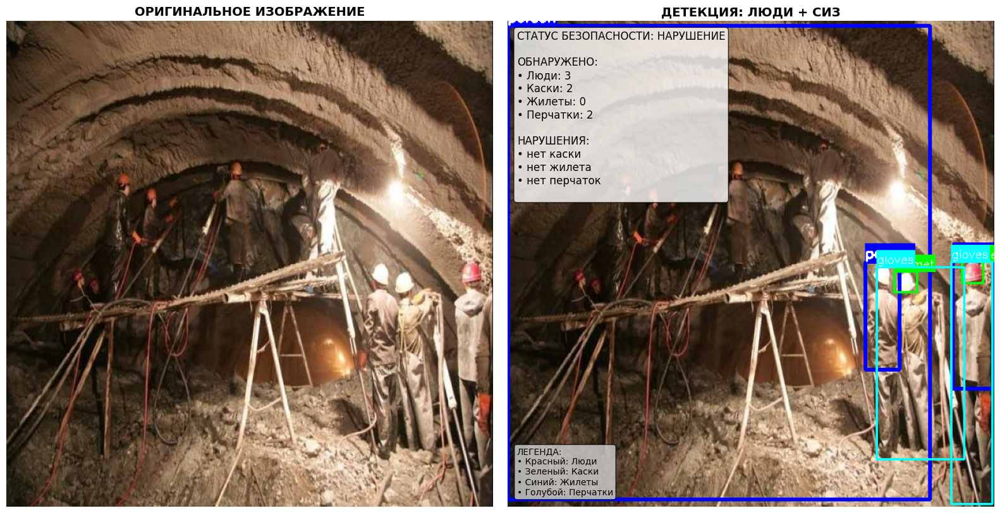

   👥 Люди: 3 | ⛑️ Каски: 2 | 🦺 Жилеты: 0 | 🧤 Перчатки: 2
   📋 Статус: НАРУШЕНИЕ
   ⚠️ Нарушения: нет каски, нет жилета, нет перчаток

📊 Анализ 2/8: 02761_jpg.rf.18d75f4f04b5bafccc46fa33a79abc92.jpg


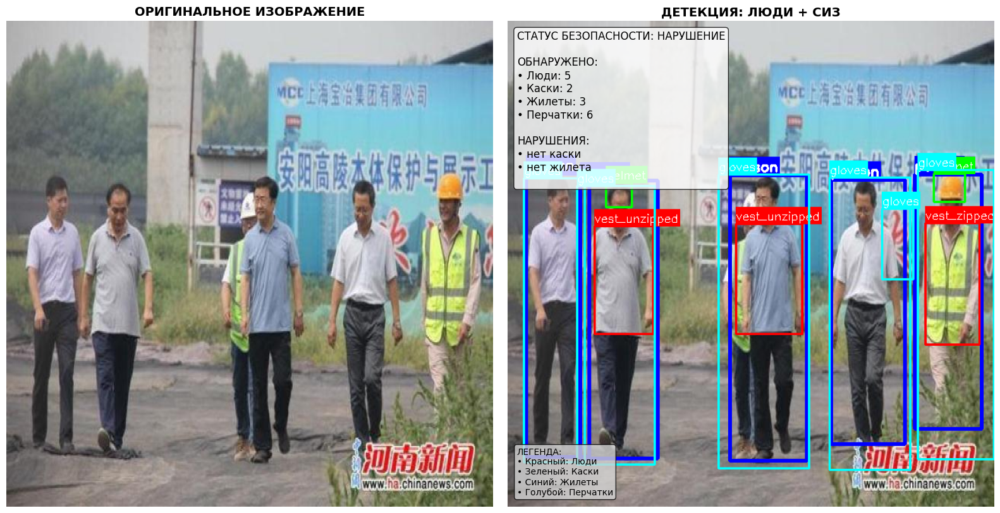

   👥 Люди: 5 | ⛑️ Каски: 2 | 🦺 Жилеты: 3 | 🧤 Перчатки: 6
   📋 Статус: НАРУШЕНИЕ
   ⚠️ Нарушения: нет каски, нет жилета

📊 Анализ 3/8: 1203370400_jpg.rf.jpg


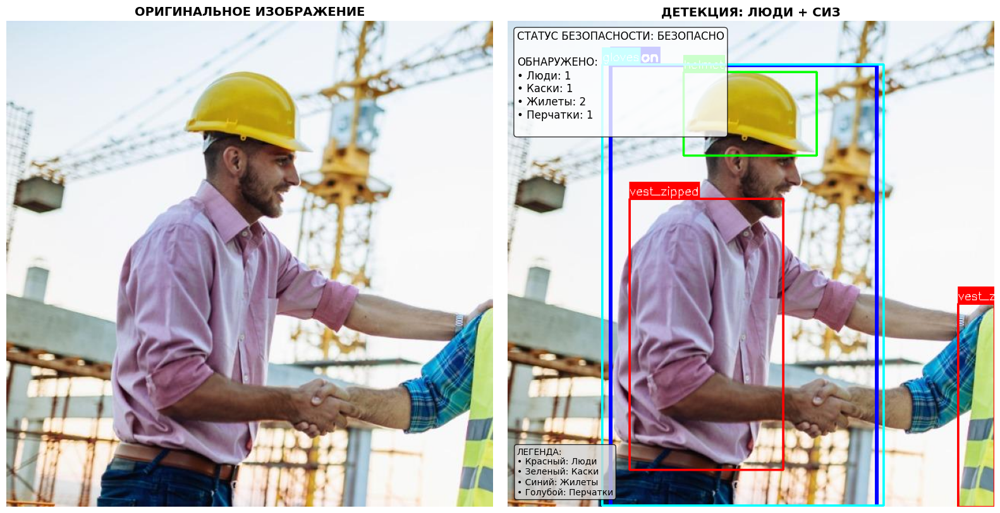

   👥 Люди: 1 | ⛑️ Каски: 1 | 🦺 Жилеты: 2 | 🧤 Перчатки: 1
   📋 Статус: БЕЗОПАСНО

📊 Анализ 4/8: pos_1349_jpg.rf.cf17f6b7c56b9ab43fda27632d1c90b8.jpg


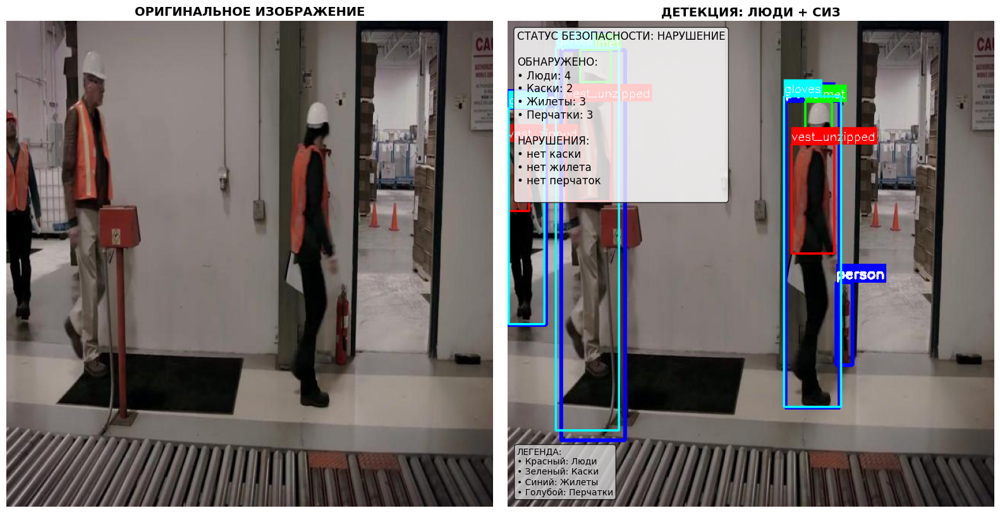

   👥 Люди: 4 | ⛑️ Каски: 2 | 🦺 Жилеты: 3 | 🧤 Перчатки: 3
   📋 Статус: НАРУШЕНИЕ
   ⚠️ Нарушения: нет каски, нет жилета, нет перчаток

📊 Анализ 5/8: 00952_jpg.rf.jpg


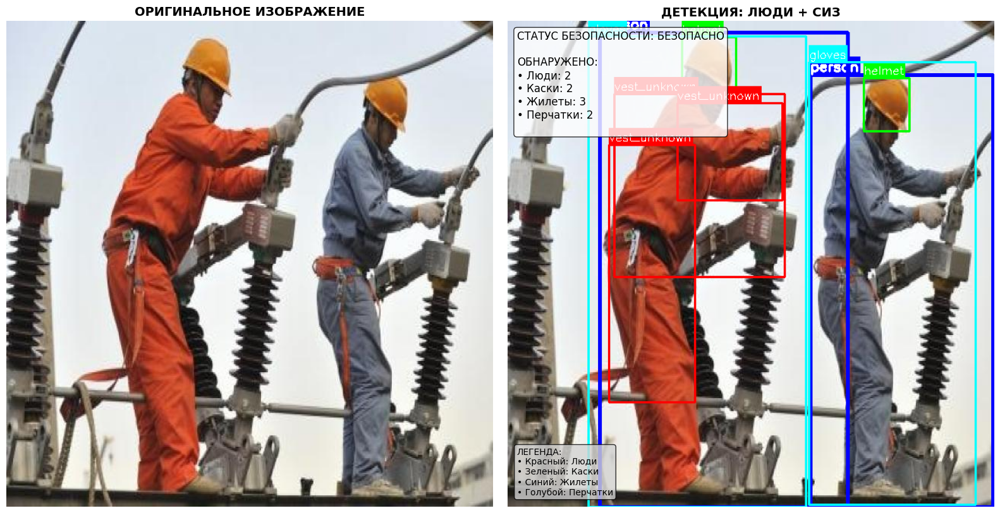

   👥 Люди: 2 | ⛑️ Каски: 2 | 🦺 Жилеты: 3 | 🧤 Перчатки: 2
   📋 Статус: БЕЗОПАСНО

📊 Анализ 6/8: 1194044255_jpg.rf.jpg


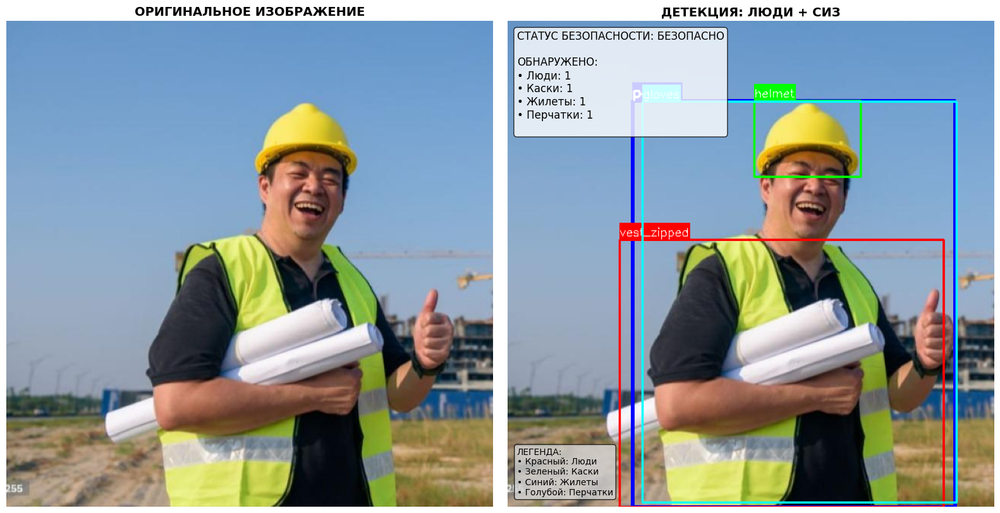

   👥 Люди: 1 | ⛑️ Каски: 1 | 🦺 Жилеты: 1 | 🧤 Перчатки: 1
   📋 Статус: БЕЗОПАСНО

📊 Анализ 7/8: helmet_jacket_07369_jpg.rf.8b7222a7bfed218dc89293aab0495a8a.jpg


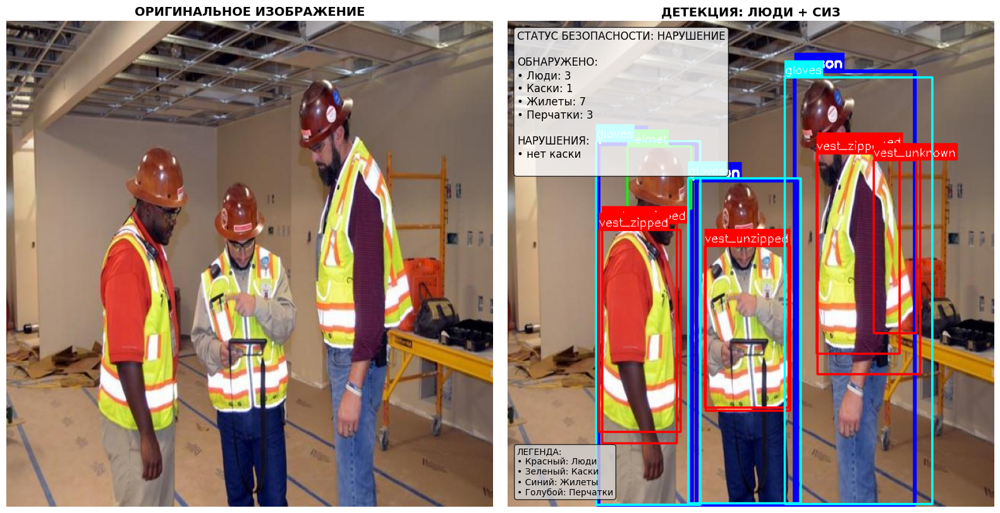

   👥 Люди: 3 | ⛑️ Каски: 1 | 🦺 Жилеты: 7 | 🧤 Перчатки: 3
   📋 Статус: НАРУШЕНИЕ
   ⚠️ Нарушения: нет каски

📊 Анализ 8/8: 1650229546_jpg.rf.jpg


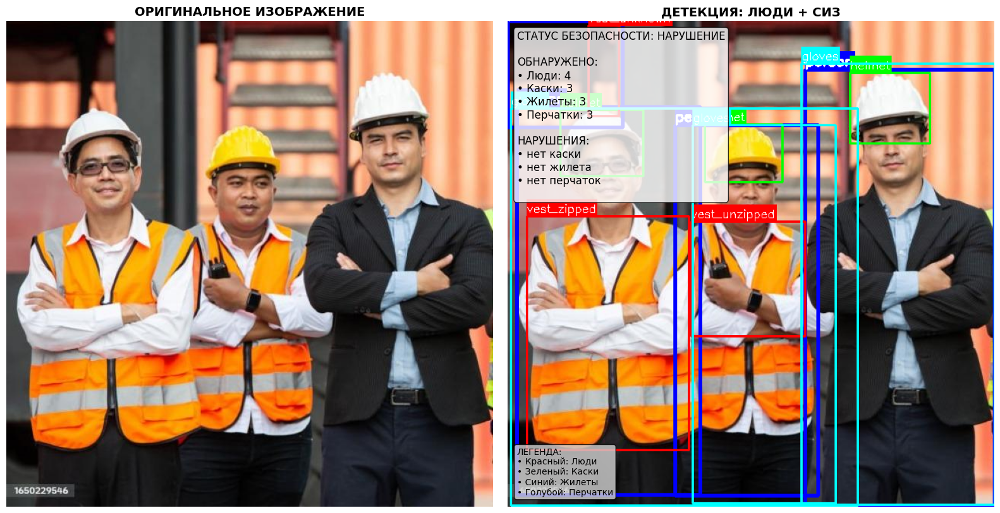

   👥 Люди: 4 | ⛑️ Каски: 3 | 🦺 Жилеты: 3 | 🧤 Перчатки: 3
   📋 Статус: НАРУШЕНИЕ
   ⚠️ Нарушения: нет каски, нет жилета, нет перчаток

ДЕМОНСТРАЦИЯ РАЗНЫХ СЦЕНАРИЕВ БЕЗОПАСНОСТИ

✅ ПОЛНАЯ ЭКИПИРОВКА: 3 пример(ов)


/tmp/ipython-input-1873753665.py:286: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


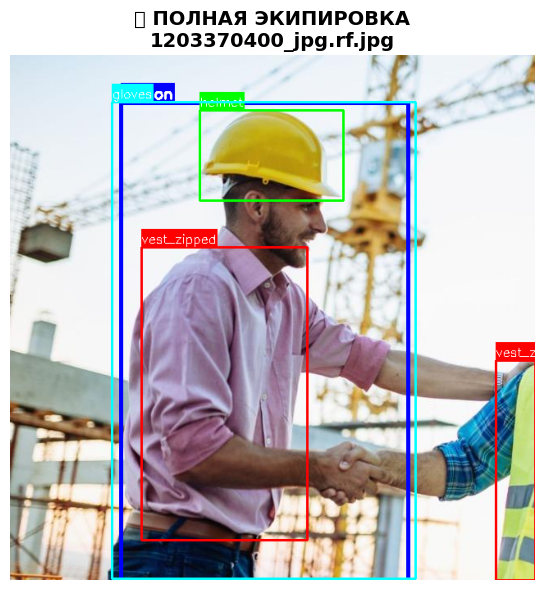


⚠️ ОТСУТСТВИЕ КАСОК: 1 пример(ов)


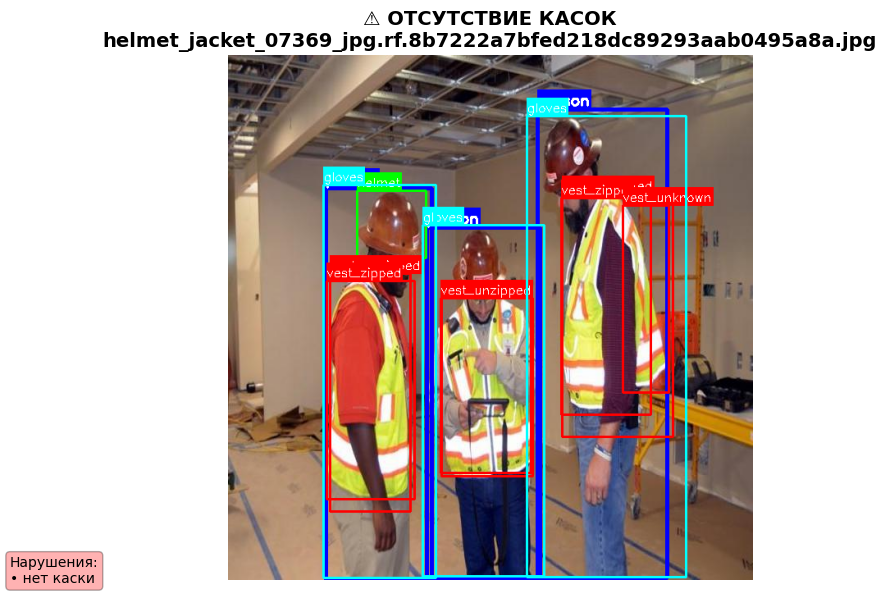


🚨 МНОЖЕСТВЕННЫЕ НАРУШЕНИЯ: 4 пример(ов)


/tmp/ipython-input-1873753665.py:286: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128680 (\N{POLICE CARS REVOLVING LIGHT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


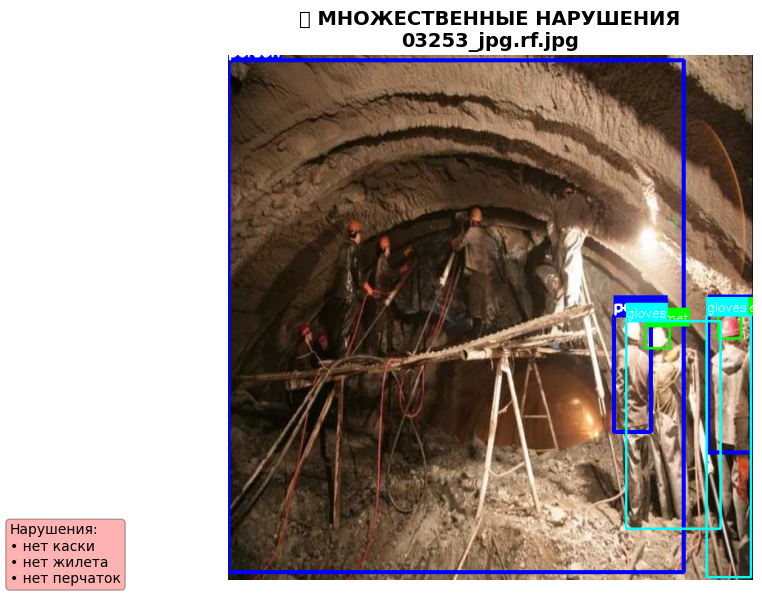

In [ ]:
def unified_safety_visualization(trained_models, num_images=6):
    """Унифицированная визуализация: люди от модели vests + все СИЗ на одном изображении"""

    if not trained_models:
        print("❌ Нет обученных моделей для визуализации!")
        return

    print(f"\n{'='*80}")
    print("УНИФИЦИРОВАННАЯ ВИЗУАЛИЗАЦИЯ БЕЗОПАСНОСТИ")
    print(f"{'='*80}")

    vests_model = trained_models.get('vests', {}).get('model')
    helmets_model = trained_models.get('helmets', {}).get('model')
    gloves_model = trained_models.get('gloves', {}).get('model')

    if not all([vests_model, helmets_model, gloves_model]):
        print("❌ Не все модели доступны!")
        return

    all_images = []
    for dataset_name, model_info in trained_models.items():
        val_dir = model_info['config'].get('val_images_dir', '')
        if os.path.exists(val_dir):
            images = [os.path.join(val_dir, f) for f in os.listdir(val_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            all_images.extend(images)

    all_images = list(set(all_images))[:num_images]

    print(f"\n🖼️ Анализируем {len(all_images)} изображений...")

    colors = {
        'person': (255, 0, 0),
        'helmet': (0, 255, 0),
        'vest': (0, 0, 255),
        'gloves': (255, 255, 0),
    }

    safety_scenarios = {
        'safe': [],
        'no_helmets': [],
        'no_vests': [],
        'no_gloves': [],
        'multiple_issues': []
    }

    for img_idx, img_path in enumerate(all_images):
        if not os.path.exists(img_path):
            continue

        img_name = os.path.basename(img_path)
        print(f"\n📊 Анализ {img_idx + 1}/{len(all_images)}: {img_name}")

        try:
            original_img = plt.imread(img_path)
            if original_img.dtype == np.float32:
                viz_img = (original_img * 255).astype(np.uint8)
            else:
                viz_img = original_img.copy()

            if len(viz_img.shape) == 3 and viz_img.shape[2] == 3:
                viz_img = cv2.cvtColor(viz_img, cv2.COLOR_RGB2BGR)


            vests_results = vests_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)
            people_boxes = vests_results[0].boxes

            person_count = 0
            if people_boxes is not None:
                for box in people_boxes:
                    cls_idx = int(box.cls)
                    if cls_idx == 0:
                        person_count += 1
                        bbox = box.xyxy[0].cpu().numpy()
                        x1, y1, x2, y2 = map(int, bbox)


                        cv2.rectangle(viz_img, (x1, y1), (x2, y2), colors['person'], 3)


                        label = "person"
                        label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)[0]
                        cv2.rectangle(viz_img, (x1, y1 - label_size[1] - 10),
                                    (x1 + label_size[0], y1), colors['person'], -1)
                        cv2.putText(viz_img, label, (x1, y1 - 5),
                                  cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)


            helmets_count = 0
            helmets_results = helmets_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)
            helmets_boxes = helmets_results[0].boxes
            if helmets_boxes is not None:
                for box in helmets_boxes:
                    cls_idx = int(box.cls)
                    if cls_idx == 0:
                        helmets_count += 1
                        bbox = box.xyxy[0].cpu().numpy()
                        x1, y1, x2, y2 = map(int, bbox)

                        cv2.rectangle(viz_img, (x1, y1), (x2, y2), colors['helmet'], 2)

                        label = "helmet"
                        label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
                        cv2.rectangle(viz_img, (x1, y1 - label_size[1] - 10),
                                    (x1 + label_size[0], y1), colors['helmet'], -1)
                        cv2.putText(viz_img, label, (x1, y1 - 5),
                                  cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

            vests_count = 0
            vests_boxes = vests_results[0].boxes
            if vests_boxes is not None:
                for box in vests_boxes:
                    cls_idx = int(box.cls)
                    if cls_idx in [1, 2, 3]:
                        vests_count += 1
                        bbox = box.xyxy[0].cpu().numpy()
                        x1, y1, x2, y2 = map(int, bbox)

                        cv2.rectangle(viz_img, (x1, y1), (x2, y2), colors['vest'], 2)

                        vest_types = {1: 'unzipped', 2: 'zipped', 3: 'unknown'}
                        label = f"vest_{vest_types.get(cls_idx, 'unknown')}"
                        label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
                        cv2.rectangle(viz_img, (x1, y1 - label_size[1] - 10),
                                    (x1 + label_size[0], y1), colors['vest'], -1)
                        cv2.putText(viz_img, label, (x1, y1 - 5),
                                  cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

            gloves_count = 0
            gloves_results = gloves_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)
            gloves_boxes = gloves_results[0].boxes
            if gloves_boxes is not None:
                for box in gloves_boxes:
                    cls_idx = int(box.cls)
                    if cls_idx == 0:
                        gloves_count += 1
                        bbox = box.xyxy[0].cpu().numpy()
                        x1, y1, x2, y2 = map(int, bbox)


                        cv2.rectangle(viz_img, (x1, y1), (x2, y2), colors['gloves'], 2)

                        label = "gloves"
                        label_size = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)[0]
                        cv2.rectangle(viz_img, (x1, y1 - label_size[1] - 10),
                                    (x1 + label_size[0], y1), colors['gloves'], -1)
                        cv2.putText(viz_img, label, (x1, y1 - 5),
                                  cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)


            safety_issues = []
            if person_count > 0:
                if person_count > helmets_count:
                    safety_issues.append("нет каски")
                if person_count > vests_count:
                    safety_issues.append("нет жилета")
                if person_count > gloves_count:
                    safety_issues.append("нет перчаток")

            if person_count == 0:
                safety_status = "НЕТ ЛЮДЕЙ"
                status_color = (255, 165, 0)
            elif safety_issues:
                safety_status = "НАРУШЕНИЕ"
                status_color = (0, 0, 255)

                if len(safety_issues) >= 2:
                    safety_scenarios['multiple_issues'].append((img_path, viz_img, safety_issues))
                elif "нет каски" in safety_issues:
                    safety_scenarios['no_helmets'].append((img_path, viz_img, safety_issues))
                elif "нет жилета" in safety_issues:
                    safety_scenarios['no_vests'].append((img_path, viz_img, safety_issues))
                elif "нет перчаток" in safety_issues:
                    safety_scenarios['no_gloves'].append((img_path, viz_img, safety_issues))
            else:
                safety_status = "БЕЗОПАСНО"
                status_color = (0, 255, 0)
                safety_scenarios['safe'].append((img_path, viz_img, safety_issues))

            viz_img_rgb = cv2.cvtColor(viz_img, cv2.COLOR_BGR2RGB)

            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

            ax1.imshow(original_img)
            ax1.set_title('ОРИГИНАЛЬНОЕ ИЗОБРАЖЕНИЕ', fontsize=14, fontweight='bold')
            ax1.axis('off')

            ax2.imshow(viz_img_rgb)
            ax2.set_title('ДЕТЕКЦИЯ: ЛЮДИ + СИЗ', fontsize=14, fontweight='bold')
            ax2.axis('off')


            info_text = f"СТАТУС БЕЗОПАСНОСТИ: {safety_status}\n\n"
            info_text += f"ОБНАРУЖЕНО:\n"
            info_text += f"• Люди: {person_count}\n"
            info_text += f"• Каски: {helmets_count}\n"
            info_text += f"• Жилеты: {vests_count}\n"
            info_text += f"• Перчатки: {gloves_count}\n"

            if safety_issues:
                info_text += f"\nНАРУШЕНИЯ:\n"
                for issue in safety_issues:
                    info_text += f"• {issue}\n"

            ax2.text(0.02, 0.98, info_text, transform=ax2.transAxes, fontsize=12,
                   verticalalignment='top', bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            legend_text = "ЛЕГЕНДА:\n"
            legend_text += "• Красный: Люди\n"
            legend_text += "• Зеленый: Каски\n"
            legend_text += "• Синий: Жилеты\n"
            legend_text += "• Голубой: Перчатки"

            ax2.text(0.02, 0.02, legend_text, transform=ax2.transAxes, fontsize=10,
                   verticalalignment='bottom', bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))

            plt.tight_layout()
            plt.show()

            print(f"   👥 Люди: {person_count} | ⛑️ Каски: {helmets_count} | 🦺 Жилеты: {vests_count} | 🧤 Перчатки: {gloves_count}")
            print(f"   📋 Статус: {safety_status}")
            if safety_issues:
                print(f"   ⚠️ Нарушения: {', '.join(safety_issues)}")

        except Exception as e:
            print(f"❌ Ошибка при обработке {img_name}: {e}")
            continue

    print(f"\n{'='*80}")
    print("ДЕМОНСТРАЦИЯ РАЗНЫХ СЦЕНАРИЕВ БЕЗОПАСНОСТИ")
    print(f"{'='*80}")

    scenario_titles = {
        'safe': "✅ ПОЛНАЯ ЭКИПИРОВКА",
        'no_helmets': "⚠️ ОТСУТСТВИЕ КАСОК",
        'no_vests': "⚠️ ОТСУТСТВИЕ ЖИЛЕТОВ",
        'no_gloves': "⚠️ ОТСУТСТВИЕ ПЕРЧАТОК",
        'multiple_issues': "🚨 МНОЖЕСТВЕННЫЕ НАРУШЕНИЯ"
    }

    for scenario, examples in safety_scenarios.items():
        if examples:
            print(f"\n{scenario_titles[scenario]}: {len(examples)} пример(ов)")

            img_path, viz_img, issues = examples[0]
            img_name = os.path.basename(img_path)

            viz_img_rgb = cv2.cvtColor(viz_img, cv2.COLOR_BGR2RGB)

            plt.figure(figsize=(10, 6))
            plt.imshow(viz_img_rgb)
            plt.title(f"{scenario_titles[scenario]}\n{img_name}", fontsize=14, fontweight='bold')
            plt.axis('off')

            if issues:
                issues_text = "Нарушения:\n" + "\n".join([f"• {issue}" for issue in issues])
                plt.figtext(0.02, 0.02, issues_text, fontsize=10,
                          bbox=dict(boxstyle='round', facecolor='red', alpha=0.3))

            plt.tight_layout()
            plt.show()

print("\n🚀 ЗАПУСК УНИФИЦИРОВАННОЙ ВИЗУАЛИЗАЦИИ...")
unified_safety_visualization(trained_models, num_images=8)

def find_specific_scenarios(trained_models, scenario_type="no_helmets", max_examples=3):
    """Находит конкретные сценарии нарушений"""

    print(f"\n🔍 ПОИСК СЦЕНАРИЕВ: {scenario_type.upper()}")

    vests_model = trained_models.get('vests', {}).get('model')
    helmets_model = trained_models.get('helmets', {}).get('model')
    gloves_model = trained_models.get('gloves', {}).get('model')

    if not all([vests_model, helmets_model, gloves_model]):
        return

    all_images = []
    for dataset_name, model_info in trained_models.items():
        val_dir = model_info['config'].get('val_images_dir', '')
        if os.path.exists(val_dir):
            images = [os.path.join(val_dir, f) for f in os.listdir(val_dir)
                     if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
            all_images.extend(images)

    all_images = list(set(all_images))
    found_examples = []

    for img_path in all_images:
        if len(found_examples) >= max_examples:
            break

        try:
            vests_results = vests_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)
            helmets_results = helmets_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)
            gloves_results = gloves_model.predict(source=img_path, conf=0.15, device='cpu', verbose=False)

            people_boxes = vests_results[0].boxes
            person_count = len([b for b in people_boxes if int(b.cls) == 0]) if people_boxes else 0

            helmets_boxes = helmets_results[0].boxes
            helmets_count = len([b for b in helmets_boxes if int(b.cls) == 0]) if helmets_boxes else 0

            gloves_boxes = gloves_results[0].boxes
            gloves_count = len([b for b in gloves_boxes if int(b.cls) == 0]) if gloves_boxes else 0

            vests_boxes = vests_results[0].boxes
            vests_count = len([b for b in vests_boxes if int(b.cls) in [1,2,3]]) if vests_boxes else 0

            if scenario_type == "no_helmets" and person_count > helmets_count and person_count > 0:
                found_examples.append((img_path, person_count, helmets_count, vests_count, gloves_count))
            elif scenario_type == "no_vests" and person_count > vests_count and person_count > 0:
                found_examples.append((img_path, person_count, helmets_count, vests_count, gloves_count))
            elif scenario_type == "no_gloves" and person_count > gloves_count and person_count > 0:
                found_examples.append((img_path, person_count, helmets_count, vests_count, gloves_count))
            elif scenario_type == "safe" and person_count > 0 and person_count <= helmets_count and person_count <= vests_count and person_count <= gloves_count:
                found_examples.append((img_path, person_count, helmets_count, vests_count, gloves_count))

        except Exception as e:
            continue

    print(f"📋 Найдено примеров: {len(found_examples)}")
    return found_examples